# Breast Cancer (SMC, 2018)

"Multi-omics profiling of younger Asian breast cancers reveals distinctive molecular signatures" Kan et al. 

The dataset is composed by a total of 187 primary tumors samples from a Korean BC cohort encriched in pre-menopausal patients. Whole-exome sequencing and transcriptome profiling were performed on the BC cohort. The aim of the analysis was to investigate the main cause of worse outcomes in BC arising in younger patients.

In [4]:
import os

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import ydata_profiling as yp
from ydata_profiling import ProfileReport

In [6]:
os.chdir("C:/Users/Cristina/OneDrive/Documenti/BCG/Tesi/Datasets/Breast Cancer (SMC 2018)")

## Patients clinical data 

In [7]:
data_clinical_patient=pd.read_csv('data_clinical_patient.csv', sep=None, engine='python')
data_clinical_patient

,PATIENT_ID,CENTER,COHORT,RACE,SEX,AGE,MENOPAUSAL_STATUS_AT_DIAGNOSIS,TREATMENT_CHEMOTHERAPY,HISTOLOGY_SUBTYPE
0,brca_smc_2018_BB01_002,SMC,IBC,ASIAN,Female,58.91,Post,No,Ductal Carcinoma
1,brca_smc_2018_BB01_004,SMC,IBC,ASIAN,Female,46.69,Pre,No,Ductal Carcinoma
2,brca_smc_2018_BB01_005,SMC,IBC,ASIAN,Female,50.84,Pre,No,Ductal Carcinoma
3,brca_smc_2018_BB01_006,SMC,IBC,ASIAN,Female,52.64,Post,No,Ductal Carcinoma
4,brca_smc_2018_BB01_007,SMC,IBC,ASIAN,Female,46.96,Pre,Yes,Ductal Carcinoma
...,...,...,...,...,...,...,...,...,...
182,brca_smc_2018_BR442,SMC,YBC,ASIAN,Female,38.88,Pre,No,Ductal Carcinoma
183,brca_smc_2018_BR457,SMC,YBC,ASIAN,Female,37.48,Pre,No,Ductal Carcinoma
184,brca_smc_2018_BR469,SMC,YBC,ASIAN,Female,38.68,Pre,No,Ductal Carcinoma
185,brca_smc_2018_BR065,SMC,YBC,ASIAN,Female,33.70,Pre,Yes,Lobular Carcinoma


In [8]:
profile_patient = ProfileReport(data_clinical_patient, title="Pandas Profiling Report")

In [9]:
profile_patient 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The observations (patients) are 187. The center of sequencing is SMC (Samsung Medical Center in Korea) for all the patients. 
The cohort is divided into two age groups: YBC (age <= 40) are the 66.8%; IBC (40 < age <= 60) is the 33.2%. 
All the patient are female Asian. The age for each pts is indicated: mean value= 39.25, with a minimum of 23.36 and a maximum of 64.52.
The vast majority of the cohort are pre-menopausal (88.2%), while the 10.2% are post-menopausal. 
Most of the patients did not undergo chemotherapy (95.2%) and 92% of the samples is ductal carcinoma as histology subtype.

#### Select ductal BC patients 

In [10]:
# select Ductal carcinoma patients 
ductal_pts = data_clinical_patient.loc[data_clinical_patient['HISTOLOGY_SUBTYPE']=='Ductal Carcinoma']
ductal_pts = ductal_pts[['PATIENT_ID','HISTOLOGY_SUBTYPE']]
ductal_pts

,PATIENT_ID,HISTOLOGY_SUBTYPE
0,brca_smc_2018_BB01_002,Ductal Carcinoma
1,brca_smc_2018_BB01_004,Ductal Carcinoma
2,brca_smc_2018_BB01_005,Ductal Carcinoma
3,brca_smc_2018_BB01_006,Ductal Carcinoma
4,brca_smc_2018_BB01_007,Ductal Carcinoma
...,...,...
180,brca_smc_2018_BR431,Ductal Carcinoma
181,brca_smc_2018_BR437,Ductal Carcinoma
182,brca_smc_2018_BR442,Ductal Carcinoma
183,brca_smc_2018_BR457,Ductal Carcinoma


In [11]:
ductal_pts = ductal_pts[['PATIENT_ID']]
ductal_pts

,PATIENT_ID
0,brca_smc_2018_BB01_002
1,brca_smc_2018_BB01_004
2,brca_smc_2018_BB01_005
3,brca_smc_2018_BB01_006
4,brca_smc_2018_BB01_007
...,...
180,brca_smc_2018_BR431
181,brca_smc_2018_BR437
182,brca_smc_2018_BR442
183,brca_smc_2018_BR457


#### Select non-treated patients

In [12]:
# select only the patients that were not subjected to chemotherapy treatment
data_clinical_patient=data_clinical_patient.loc[data_clinical_patient['TREATMENT_CHEMOTHERAPY']=='No']
data_clinical_patient

,PATIENT_ID,CENTER,COHORT,RACE,SEX,AGE,MENOPAUSAL_STATUS_AT_DIAGNOSIS,TREATMENT_CHEMOTHERAPY,HISTOLOGY_SUBTYPE
0,brca_smc_2018_BB01_002,SMC,IBC,ASIAN,Female,58.91,Post,No,Ductal Carcinoma
1,brca_smc_2018_BB01_004,SMC,IBC,ASIAN,Female,46.69,Pre,No,Ductal Carcinoma
2,brca_smc_2018_BB01_005,SMC,IBC,ASIAN,Female,50.84,Pre,No,Ductal Carcinoma
3,brca_smc_2018_BB01_006,SMC,IBC,ASIAN,Female,52.64,Post,No,Ductal Carcinoma
5,brca_smc_2018_BB01_008,SMC,IBC,ASIAN,Female,61.26,Post,No,Ductal Carcinoma
...,...,...,...,...,...,...,...,...,...
181,brca_smc_2018_BR437,SMC,YBC,ASIAN,Female,36.97,Pre,No,Ductal Carcinoma
182,brca_smc_2018_BR442,SMC,YBC,ASIAN,Female,38.88,Pre,No,Ductal Carcinoma
183,brca_smc_2018_BR457,SMC,YBC,ASIAN,Female,37.48,Pre,No,Ductal Carcinoma
184,brca_smc_2018_BR469,SMC,YBC,ASIAN,Female,38.68,Pre,No,Ductal Carcinoma


In [13]:
# patients not subjected to chemotherapy treatment
NO_treated_patients=data_clinical_patient[['PATIENT_ID']]
NO_treated_patients

,PATIENT_ID
0,brca_smc_2018_BB01_002
1,brca_smc_2018_BB01_004
2,brca_smc_2018_BB01_005
3,brca_smc_2018_BB01_006
5,brca_smc_2018_BB01_008
...,...
181,brca_smc_2018_BR437
182,brca_smc_2018_BR442
183,brca_smc_2018_BR457
184,brca_smc_2018_BR469


## Samples clinical data 

In [14]:
data_clinical_sample=pd.read_csv('data_clinical_sample.csv', sep=None, engine='python' )
data_clinical_sample

,SAMPLE_ID,PATIENT_ID,INITIAL_TNM_STAGE,SUBTYPE_CONSENSUS,IHC_SUBTYPE,PAM50_SUBTYPE,TUMOR_PURITY,MUTATION_BURDEN,CYT_SCORE,SOMATIC_STATUS,SAMPLE_CLASS,SAMPLE_TYPE,ONCOTREE_CODE,CANCER_TYPE,CANCER_TYPE_DETAILED,TMB_NONSYNONYMOUS
0,brca_smc_2018_BB01_002,brca_smc_2018_BB01_002,3A,ER+,ER+,LuminalB,40.0,130.10300,1.165.587.835,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,0.666666667
1,brca_smc_2018_BB01_004,brca_smc_2018_BB01_004,2A,TN,TN,Basal,85.0,0.69897,6.107.734.523,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,0.2
2,brca_smc_2018_BB01_005,brca_smc_2018_BB01_005,2A,ER+,ER+HER2+,LuminalB,85.0,154.40700,1.132.946.601,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,1.166.666.667
3,brca_smc_2018_BB01_006,brca_smc_2018_BB01_006,3C,ER+,ER+,LuminalB,40.0,175.58700,5.988.873.016,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,1.9
4,brca_smc_2018_BB01_007,brca_smc_2018_BB01_007,3C,ER+HER2+,UA,LuminalB,75.0,144.71600,6.635.088.545,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,0.933333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
182,brca_smc_2018_BR442,brca_smc_2018_BR442,2B,ER+,ER+,LuminalA,NaN,153.14800,473.894.503,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,1.133.333.333
183,brca_smc_2018_BR457,brca_smc_2018_BR457,3C,ER+,ER+,LuminalB,NaN,176.34300,3.613.813.498,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,1.933.333.333
184,brca_smc_2018_BR469,brca_smc_2018_BR469,3C,ER+,ER+,LuminalB,NaN,111.39400,1.731.991.917,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,0.433333333
185,brca_smc_2018_BR065,brca_smc_2018_BR065,3C,ER+,ER+,LuminalA,80.0,NaN,2.746.998.362,Matched,Tumor,Primary,ILC,Breast Cancer,Breast Invasive Lobular Carcinoma,NaN


In [15]:
NO_treated_samples=pd.merge(NO_treated_patients, data_clinical_sample, how='inner', on=['PATIENT_ID'])
NO_treated_samples

,PATIENT_ID,SAMPLE_ID,INITIAL_TNM_STAGE,SUBTYPE_CONSENSUS,IHC_SUBTYPE,PAM50_SUBTYPE,TUMOR_PURITY,MUTATION_BURDEN,CYT_SCORE,SOMATIC_STATUS,SAMPLE_CLASS,SAMPLE_TYPE,ONCOTREE_CODE,CANCER_TYPE,CANCER_TYPE_DETAILED,TMB_NONSYNONYMOUS
0,brca_smc_2018_BB01_002,brca_smc_2018_BB01_002,3A,ER+,ER+,LuminalB,40.0,130.10300,1.165.587.835,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,0.666666667
1,brca_smc_2018_BB01_004,brca_smc_2018_BB01_004,2A,TN,TN,Basal,85.0,0.69897,6.107.734.523,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,0.2
2,brca_smc_2018_BB01_005,brca_smc_2018_BB01_005,2A,ER+,ER+HER2+,LuminalB,85.0,154.40700,1.132.946.601,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,1.166.666.667
3,brca_smc_2018_BB01_006,brca_smc_2018_BB01_006,3C,ER+,ER+,LuminalB,40.0,175.58700,5.988.873.016,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,1.9
4,brca_smc_2018_BB01_008,brca_smc_2018_BB01_008,2A,ER+HER2+,UA,LuminalB,60.0,134.24200,1.222.376.374,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,0.733333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,brca_smc_2018_BR437,brca_smc_2018_BR437,2B,ER+,ER+,LuminalA,NaN,173.23900,9.174.213.863,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,1.766.666.667
174,brca_smc_2018_BR442,brca_smc_2018_BR442,2B,ER+,ER+,LuminalA,NaN,153.14800,473.894.503,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,1.133.333.333
175,brca_smc_2018_BR457,brca_smc_2018_BR457,3C,ER+,ER+,LuminalB,NaN,176.34300,3.613.813.498,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,1.933.333.333
176,brca_smc_2018_BR469,brca_smc_2018_BR469,3C,ER+,ER+,LuminalB,NaN,111.39400,1.731.991.917,Matched,Tumor,Primary,IDC,Breast Cancer,Breast Invasive Ductal Carcinoma,0.433333333


In [16]:
profile_sample = ProfileReport(data_clinical_sample, title="Pandas Profiling Report")

In [17]:
profile_sample

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

For each sample, the stage (INITIAL_TNM_STAGE) of the tumor is indicated: the most three frequent stages are 2A (33.7%), 2B (20.3%) and 3A (18.2%).
The majority of the samples are ER+ (55.1%)(SUBTYPE_CONSENSUS).
The scientists classified intrinsic molecular subtypes for the BC cohorts using three methods: ER and HER2 immunohistochemistry (IHC) analyses, gene expression classifier (PAM50) and NMC, that is a naive molecular classifier based on ESR1, PGR, ERBB2 gene expression and ERBB2 copy number data. A consensus classifier was derived based on three classifications and used for subsequent analyses. The IHC subtype and the PAM50 subtype classifications are present in the dataset. 
Tumor purity (mean: 70.9%), mutation burden (mean: 144.5) and cytolytic activity score are present.
ONCOTREE_CODE and CANCER_TYPE_DETAILED give the same type of information, one of them is redundant.


In [18]:
# keep only the relevant variables 
data_clinical_sample_relevant=data_clinical_sample.drop(['IHC_SUBTYPE','PAM50_SUBTYPE', 'SOMATIC_STATUS', 'SAMPLE_CLASS', 'SAMPLE_TYPE', 'ONCOTREE_CODE', 'CANCER_TYPE'], axis=1)

In [19]:
data_clinical_sample.isin(['3B']).any().any()

False

In [20]:
data_clinical_sample.isin(['3C']).any().any()

True

#### Select ductal TNBC patients

In [21]:
# select the TN patients 
TN_pts = data_clinical_sample_relevant.loc[data_clinical_sample_relevant['SUBTYPE_CONSENSUS']=='TN']
TN_pts = TN_pts[['PATIENT_ID', 'SUBTYPE_CONSENSUS']]
TN_pts

,PATIENT_ID,SUBTYPE_CONSENSUS
1,brca_smc_2018_BB01_004,TN
17,brca_smc_2018_BB01_022,TN
20,brca_smc_2018_BB01_026,TN
27,brca_smc_2018_BB01_035,TN
29,brca_smc_2018_BB01_037,TN
31,brca_smc_2018_BB01_040,TN
32,brca_smc_2018_BB01_041,TN
33,brca_smc_2018_BB01_044,TN
41,brca_smc_2018_BB01_059,TN
44,brca_smc_2018_BB01_067,TN


In [22]:
TN_pts = TN_pts[['PATIENT_ID']]
TN_pts

,PATIENT_ID
1,brca_smc_2018_BB01_004
17,brca_smc_2018_BB01_022
20,brca_smc_2018_BB01_026
27,brca_smc_2018_BB01_035
29,brca_smc_2018_BB01_037
31,brca_smc_2018_BB01_040
32,brca_smc_2018_BB01_041
33,brca_smc_2018_BB01_044
41,brca_smc_2018_BB01_059
44,brca_smc_2018_BB01_067


In [23]:
len(TN_pts)

40

In [24]:
# select patients both TN and IDC
TN_ductal_pts = pd.merge(ductal_pts, TN_pts, how='inner', on=['PATIENT_ID'])

In [25]:
len(TN_ductal_pts)

37

In [26]:
len(ductal_pts)

172

#### Select ductal non-TNBC patients 

In [27]:
# select the IDC patients not TN
x = pd.concat([TN_ductal_pts, ductal_pts])
ductal_NON_TN_pts = x.drop_duplicates(keep=False, inplace=False)

## Mutational data

In [28]:
data_mutation=pd.read_csv('data_mutations_final.csv', sep=None, engine='python')
print(data_mutation)

         Hugo_Symbol  Entrez_Gene_Id  Center NCBI_Build Chromosome  \
0             DNAH14        127602.0     NaN     GRCh37          1   
1             CTNNA2          1496.0     NaN     GRCh37          2   
2               PAX3          5077.0     NaN     GRCh37          2   
3             COL4A4          1286.0     NaN     GRCh37          2   
4              FBXL7         23194.0     NaN     GRCh37          5   
...              ...             ...     ...        ...        ...   
6880  RP11-1407O15.2             NaN     NaN     GRCh37         17   
6881    CTD-3064M3.7             NaN     NaN     GRCh37          8   
6882            WTIP        126374.0     NaN     GRCh37         19   
6883          PKD1L2        114780.0     NaN     GRCh37         16   
6884         ZC2HC1C         79696.0     NaN     GRCh37         14   

      Start_Position  End_Position Strand  \
0          225452898     225452898      +   
1           80646578      80646578      +   
2          223161894    

In [29]:
data_mutation.isin(['ago-03']).any().any()

False

In [30]:
data_mutation.isin(['AGO3']).any().any()

True

In [31]:
data_mutation.loc[data_mutation['Transcript_ID']=='ENST00000524433']

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Consequence,Variant_Classification,...,n_alt_count,HGVSc,HGVSp,HGVSp_Short,Transcript_ID,RefSeq,Protein_position,Codons,Hotspot,COMMENTS
6361,RP11-664I21.6,NaN,NaN,GRCh37,11,124761919,124761919,+,missense_variant,Missense_Mutation,...,NaN,ENST00000524433.1:c.104C>T,p.Ser35Leu,p.S35L,ENST00000524433,NaN,35.0,tCa/tTa,0,NaN


In [32]:
profile_mutation = ProfileReport(data_mutation, title="Pandas Profiling Report")

In [33]:
profile_mutation

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The MAF file contains 6885 observations (rows) and 46 variables (columns). The mutated distinct genes are 4947. The gene with the highest number of mutations in the dataset is TP53 (1.3%), that is followed by PIK3CA (0.8%) and TTN (0.4%).

The reference genome used for the alignment (NCBI_Build) is GRCh37 for all the observations.

All the 23 chromosomes harbor mutations, even the sexual chromosome X. 
 **For SNPs, the Start_Position=End_Position.** The 84.4% of the mutations are missense mutations and they are overall SNPs(93.6%). 
Protein_position variable has 0.3% of missing values. 

NOTE: just for 185 patients out of 187 mutations are present (Tumor_Sample_Barcode)


NOTE: there are 4957 distinct Trancript_ids and 4947 distinct Hugo_symbols

In [34]:
# select the relevant variables from the MAF file
data_mutation_final=data_mutation[['Tumor_Sample_Barcode','Hugo_Symbol', 'Chromosome', 'Start_Position', 'End_Position', 'Variant_Classification', 'Variant_Type', 'Reference_Allele', 'Tumor_Seq_Allele1', 'Tumor_Seq_Allele2', 'HGVSc', 'HGVSp_Short', 'Protein_position', 'Transcript_ID']]

In [35]:
data_mutation_final['Tumor_Sample_Barcode'].nunique()

185

In [36]:
data_mutation_final[['Tumor_Sample_Barcode', 'Hugo_Symbol', 'Chromosome', 'Start_Position', 'End_Position', 'Variant_Classification', 'Variant_Type', 'Reference_Allele', 'Tumor_Seq_Allele1', 'Tumor_Seq_Allele2', 'Protein_position', 'Transcript_ID']]

,Tumor_Sample_Barcode,Hugo_Symbol,Chromosome,Start_Position,End_Position,Variant_Classification,Variant_Type,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,Protein_position,Transcript_ID
0,brca_smc_2018_BR018,DNAH14,1,225452898,225452898,Missense_Mutation,SNP,A,A,C,174.0,ENST00000327794
1,brca_smc_2018_BR018,CTNNA2,2,80646578,80646578,Missense_Mutation,SNP,G,G,T,381.0,ENST00000466387
2,brca_smc_2018_BR018,PAX3,2,223161894,223161894,Missense_Mutation,SNP,C,C,T,42.0,ENST00000392069
3,brca_smc_2018_BR018,COL4A4,2,227877014,227877014,Splice_Site,SNP,C,C,A,1406.0,ENST00000396625
4,brca_smc_2018_BR018,FBXL7,5,15936718,15936718,Missense_Mutation,SNP,T,T,C,300.0,ENST00000504595
...,...,...,...,...,...,...,...,...,...,...,...,...
6880,brca_smc_2018_BB01_051,RP11-1407O15.2,17,36365109,36365110,Frame_Shift_Ins,INS,-,-,A,162.0,ENST00000520237
6881,brca_smc_2018_BR187,CTD-3064M3.7,8,142451796,142451796,3'Flank,SNP,C,C,T,NaN,ENST00000606664
6882,brca_smc_2018_BR255,WTIP,19,34972261,34972261,5'Flank,SNP,T,T,C,NaN,ENST00000590071
6883,brca_smc_2018_BB01_044,PKD1L2,16,81219212,81219212,5'Flank,SNP,G,G,T,NaN,ENST00000527937


In this dataset sample IDs and patient IDs are equal.

In [37]:
data_mutation_final['Hugo_Symbol'].nunique()

4947

In [38]:
patient_sample=NO_treated_samples.iloc[:,0:2]

In [39]:
NO_treated_sampleID=patient_sample[['SAMPLE_ID']]

In [40]:
# adding the patient_ID to the mutation dataset 
data_mutation_sample_pts = data_mutation_final.join(patient_sample.set_index('SAMPLE_ID'), on='Tumor_Sample_Barcode')

In [41]:
data_mutation_sample_pts_NO_treated = pd.merge(NO_treated_patients, data_mutation_sample_pts, how='inner', on=['PATIENT_ID'])

In [42]:
data_mutation_sample_pts_NO_treated['PATIENT_ID'].nunique()

177

In [43]:
data_mutation_sample_pts_NO_treated=data_mutation_sample_pts_NO_treated[['Tumor_Sample_Barcode', 'PATIENT_ID','Hugo_Symbol', 'Chromosome', 'Start_Position', 'End_Position', 'Variant_Classification', 'Variant_Type', 'Reference_Allele', 'Tumor_Seq_Allele1', 'Tumor_Seq_Allele2', 'HGVSc', 'HGVSp_Short', 'Protein_position','Transcript_ID']].copy()

In [44]:
data_mutation_sample_pts_NO_treated.to_csv('mutation_table_Kan_et_al_Communications_2018.csv')

In [45]:
# reload the dataset with the addition of the gene length
data_mutation_sample_pts= pd.read_csv('mutation_table_Kan_et_al_Communications_2018_FINAL.csv', sep=None, engine='python')
data_mutation_sample_pts = data_mutation_sample_pts.iloc[:, 1:]

In [46]:
# select the unique mutated patients 
mutated_pts = data_mutation_sample_pts['PATIENT_ID'].unique()
mutated_pts = pd.DataFrame(mutated_pts, columns = ['PATIENT_ID'])

In [47]:
# select the mutated TN ductal carcinoma patients 
mutated_TN_ductal_pts = pd.merge(TN_ductal_pts, mutated_pts, how='inner', on=['PATIENT_ID'])

In [48]:
len(mutated_TN_ductal_pts)

35

In [49]:
data_mutation_TN_ductal_pts = pd.merge(TN_ductal_pts, data_mutation_sample_pts, how='inner', on=['PATIENT_ID'])

In [50]:
data_mutation_TN_ductal_pts['PATIENT_ID'].nunique()

35

In [51]:
# save the dataset 
data_mutation_TN_ductal_pts.to_csv('mutation_table_Kan_et_al_Communications_2018_TN_and_ductal.csv')

In [52]:
# select the IDC non TN patients
mutated_ductal_NON_TN_pts = pd.merge(ductal_NON_TN_pts, mutated_pts, how='inner', on=['PATIENT_ID'])

In [53]:
data_mutation_NON_TN_ductal_pts = pd.merge(ductal_NON_TN_pts, data_mutation_sample_pts, how='inner', on=['PATIENT_ID'])

In [54]:
data_mutation_NON_TN_ductal_pts['PATIENT_ID'].nunique()

129

In [55]:
# select the total ductal carcinoma mutated patients 
total_mutated_ductal_pts = pd.merge(ductal_pts, mutated_pts, how='inner', on=['PATIENT_ID'])

In [56]:
data_mutation_TOTAL_ductal_pts = pd.merge(total_mutated_ductal_pts, data_mutation_sample_pts, how='inner', on=['PATIENT_ID'])

In [57]:
data_mutation_TOTAL_ductal_pts['PATIENT_ID'].nunique()

164

In [58]:
# save the dataset 
data_mutation_TOTAL_ductal_pts.to_csv('mutation_table_Kan_et_al_Communications_2018_TOTAL_ductal.csv')

### Mutation Rate analysis

In [59]:
# add a column to the dataset representing the mutated bases length (End_Position-Start_Position+1)
data_mutation_sample_pts.loc[:, 'Mutation_length'] = data_mutation_sample_pts['End_Position']-data_mutation_sample_pts['Start_Position']+1

In [60]:
data_mutation_sample_pts['PATIENT_ID'].nunique()

177

In [61]:
# extract PATIENT_ID and Mutation_length
pts_mutation_length = data_mutation_sample_pts[['PATIENT_ID', 'Mutation_length']]

In [62]:
# group by PATIENT_ID and sum the mutation lengths for each pts
mutation_Kan_et_al_group_by_pts=pts_mutation_length.groupby(['PATIENT_ID'])['Mutation_length'].sum().reset_index()
mutation_Kan_et_al_group_by_pts.rename(columns = {'Mutation_length':'Total_sum_mutated_bases'}, inplace = True)

In [63]:
# extract Hugo_Symbol and Gene_length
gene_length_for_each_mutation = data_mutation_sample_pts[['Hugo_Symbol', 'Gene_length']]

In [64]:
# look at the number of distinct genes
gene_length_for_each_mutation['Hugo_Symbol'].nunique()

4710

In the dataset there are 4710 distinct genes. 

In [65]:
# group by gene (Hugo_Symbol) 
mutation_Kan_et_al_group_by_gene=gene_length_for_each_mutation.groupby(['Hugo_Symbol'])['Gene_length'].max().reset_index()

In [66]:
# compute the total gene length (for all the genes in the dataset)
total_GeneLength = mutation_Kan_et_al_group_by_gene['Gene_length'].sum()

In [67]:
# add a column to the dataset representing the mutation rate for each patient (Mutation_rate= Mutation_length/total_gene_length)
mutation_Kan_et_al_group_by_pts["Mutation_rate"] = mutation_Kan_et_al_group_by_pts["Total_sum_mutated_bases"]/total_GeneLength

In [68]:
# multiply the Mutation_rate values for 10^6
mutation_Kan_et_al_group_by_pts["Mutation_rate*10^6"] = mutation_Kan_et_al_group_by_pts["Mutation_rate"]*1000000

In [69]:
# the PATIENT_IDs are sorted for descending order of mutation rate 
mutation_Kan_et_al_group_by_pts = mutation_Kan_et_al_group_by_pts.sort_values(by="Mutation_rate", ascending=False)

In [70]:
patient_mutation_rate=mutation_Kan_et_al_group_by_pts[['PATIENT_ID', 'Mutation_rate*10^6' ]]

In [71]:
patients=np.arange(0,177,1)
# convert a series into a Numpy array
mutation_rate=mutation_Kan_et_al_group_by_pts[['Mutation_rate*10^6']].to_numpy()

<IPython.core.display.Javascript object>


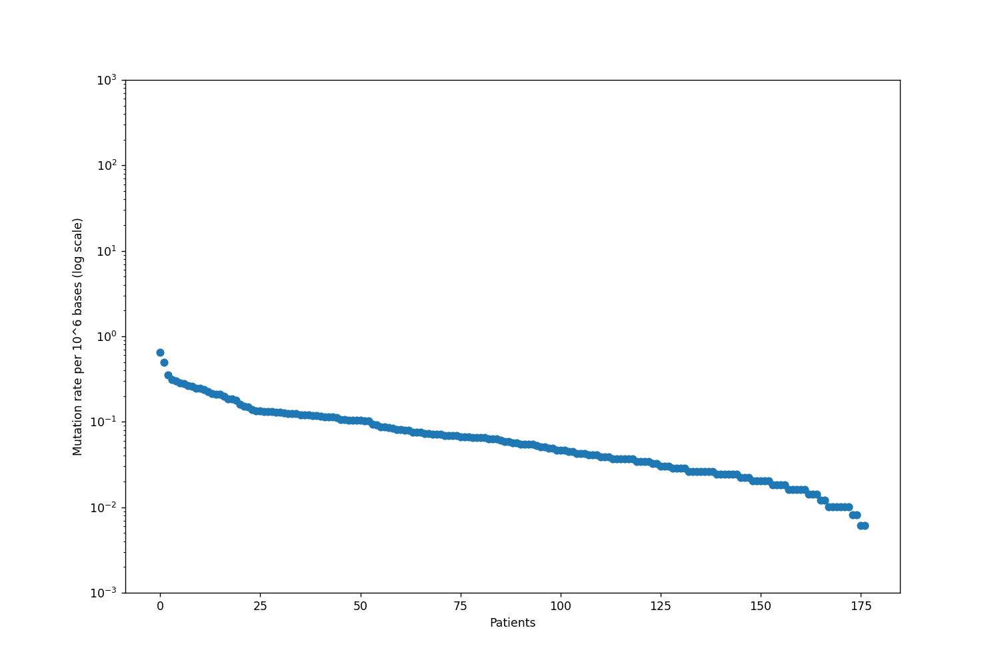

In [72]:
%matplotlib notebook
plt.rcParams['figure.figsize'] = (12, 8)
plt.yscale("log") 
#set axes limit
plt.ylim(0.001, 1000)
plt.scatter(patients, mutation_rate)
plt.xlabel("Patients")
plt.ylabel("Mutation rate per 10^6 bases (log scale)")
plt.show()

### Mutation Frequency analysis

In [73]:
genes_patients=data_mutation_sample_pts[['PATIENT_ID', 'Hugo_Symbol']]

In [74]:
n_of_pts_per_gene = genes_patients.groupby(['Hugo_Symbol'])['PATIENT_ID'].count().reset_index()
n_of_pts_per_gene.rename(columns = {'PATIENT_ID':'Num_pts_per_gene'}, inplace = True)

In [75]:
# the total number of patients is 177 
tot_pts = 177 

In [76]:
# add a column to the n_of_pts_per_gene dataframe representing the mutation frequency for each gene
n_of_pts_per_gene["Mutation_frequency (%)"] = (n_of_pts_per_gene["Num_pts_per_gene"]*100)/tot_pts

In [77]:
# the numbers of patients per gene are sorted in descending order
n_of_pts_per_gene = n_of_pts_per_gene.sort_values(by="Num_pts_per_gene", ascending=False)

In [78]:
gene_mutation_frequency = n_of_pts_per_gene[['Hugo_Symbol', 'Mutation_frequency (%)']]

In [79]:
# select the first 50 genes
highest_mutated_genes=gene_mutation_frequency.head(50)

In [80]:
mutated_gene_names=highest_mutated_genes['Hugo_Symbol'].tolist()

<IPython.core.display.Javascript object>


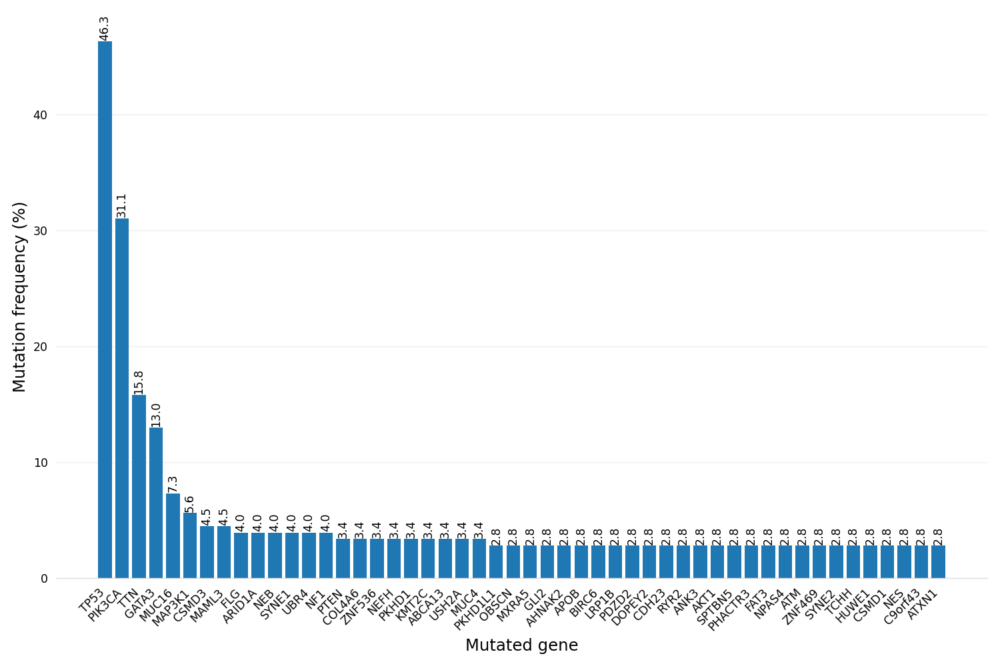

In [81]:
# increase the quality and resolution of the chart
from IPython.display import set_matplotlib_formats
import matplotlib_inline.backend_inline

matplotlib_inline.backend_inline.set_matplotlib_formats('retina')
# set default figure size.
plt.rcParams['figure.figsize'] = (12, 8)
fig, ax = plt.subplots()
h=ax.bar(highest_mutated_genes['Hugo_Symbol'], highest_mutated_genes['Mutation_frequency (%)'], label=mutated_gene_names)
xticks_pos = [0.65*patch.get_width() + patch.get_xy()[0] for patch in h]

_ = plt.xticks(xticks_pos, mutated_gene_names,  ha='right', rotation=45)
#plt.title('Highest mutated genes', fontsize=14)
plt.xlabel('Mutated gene', fontsize=14)
plt.ylabel('Mutation frequency (%)', fontsize=14)


# First, let's remove the top, right and left spines (figure borders)
# which really aren't necessary for a bar chart.
# Also, make the bottom spine gray instead of black.
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#DDDDDD')

# Second, remove the ticks as well.
ax.tick_params(bottom=False, left=False)

# Third, add a horizontal grid (but keep the vertical grid hidden).
# Color the lines a light gray as well.
ax.set_axisbelow(True)
ax.yaxis.grid(True, color='#EEEEEE')
ax.xaxis.grid(False)

# Add text annotations to the top of the bars.
# Note, you'll have to adjust this slightly (the 0.3)
# with different data.
for bar in h:
  ax.text(
      bar.get_x() + bar.get_width() / 2,
      bar.get_height() + 0.3,
      round(bar.get_height(), 1),
      rotation='vertical',
      horizontalalignment='center'
  )


fig.tight_layout()

### Normalized Mutation Frequency analysis

In [82]:
# adding the gene length to the gene_mutation_frequency dataset 
gene_mutation_frequency_gene_length = gene_mutation_frequency.join(mutation_Kan_et_al_group_by_gene.set_index('Hugo_Symbol'), on='Hugo_Symbol')

In [83]:
# add a column to the gene_mutation_frequency_gene_length dataframe representing the mutation frequency for each gene, that is normalized based on the gene length
gene_mutation_frequency_gene_length["Normalized mutation frequency per 10^6"] = ((n_of_pts_per_gene["Num_pts_per_gene"])/(tot_pts*gene_mutation_frequency_gene_length["Gene_length"]))*1000000

In [84]:
gene_normalized_mutation_frequency = gene_mutation_frequency_gene_length[['Hugo_Symbol', 'Normalized mutation frequency per 10^6']]

In [85]:
# the Normalized mutation frequency per gene is sorted in descending order
gene_normalized_mutation_frequency = gene_normalized_mutation_frequency.sort_values(by="Normalized mutation frequency per 10^6", ascending=False)

In [86]:
# select the first 50 genes
highest_mutated_genes_normalized_frequency=gene_normalized_mutation_frequency.head(50)

In [87]:
mutated_gene_names=highest_mutated_genes_normalized_frequency['Hugo_Symbol'].tolist()

<IPython.core.display.Javascript object>


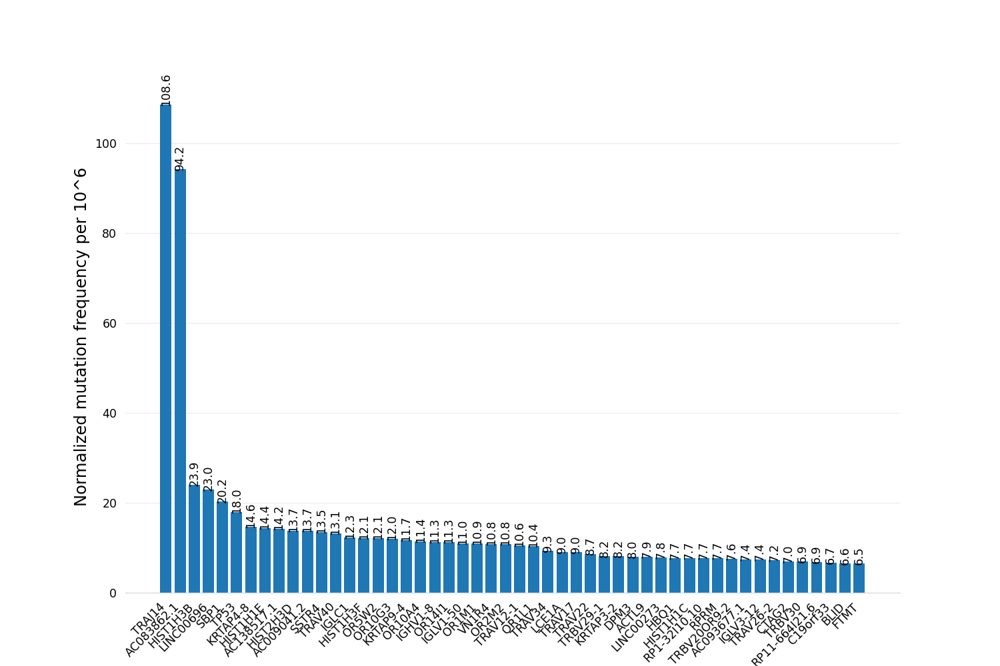

In [88]:
# increase the quality and resolution of the chart
from IPython.display import set_matplotlib_formats
import matplotlib_inline.backend_inline

matplotlib_inline.backend_inline.set_matplotlib_formats('retina')
# set default figure size.
plt.rcParams['figure.figsize'] = (12, 8)
fig, ax = plt.subplots()
h=ax.bar(highest_mutated_genes_normalized_frequency['Hugo_Symbol'], highest_mutated_genes_normalized_frequency['Normalized mutation frequency per 10^6'], label=mutated_gene_names)
xticks_pos = [0.65*patch.get_width() + patch.get_xy()[0] for patch in h]

_ = plt.xticks(xticks_pos, mutated_gene_names,  ha='right', rotation=45)
#plt.title('Highest mutated genes', fontsize=14)
plt.xlabel('Mutated gene', fontsize=14)
plt.ylabel('Normalized mutation frequency per 10^6', fontsize=14)


# First, let's remove the top, right and left spines (figure borders)
# which really aren't necessary for a bar chart.
# Also, make the bottom spine gray instead of black.
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#DDDDDD')

# Second, remove the ticks as well.
ax.tick_params(bottom=False, left=False)

# Third, add a horizontal grid (but keep the vertical grid hidden).
# Color the lines a light gray as well.
ax.set_axisbelow(True)
ax.yaxis.grid(True, color='#EEEEEE')
ax.xaxis.grid(False)

# Add text annotations to the top of the bars.
# Note, you'll have to adjust this slightly (the 0.3)
# with different data.
for bar in h:
  ax.text(
      bar.get_x() + bar.get_width() / 2,
      bar.get_height() + 0.3,
      round(bar.get_height(), 1),
      rotation='vertical',
      horizontalalignment='center'
  )


#fig.tight_layout()
